In [1]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

In [ ]:
# Lo que se hace en esta sección es importar todas las librerias necesarias.

In [2]:
data = pd.read_csv("data.csv")

In [ ]:
# Esta línea utiliza la libreria de pandas para crear un objeto llamado data que va a leer el archivo "data.csv"

In [3]:
profile = ProfileReport(data, title="Profiling Report")

In [ ]:
# Se crea un objeto profile de la libreria pandas-profiling para generar el informe de los datos proporcionados, describiendo estructura y el contenido

In [4]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Se llamó al objeto profile

In [5]:
import numpy as np
import pandas as pd

import requests
from bs4 import BeautifulSoup

from PIL import Image
from wordcloud import WordCloud, ImageColorGenerator
import matplotlib.pyplot as plt

import string
import nltk
from nltk.corpus import stopwords

In [ ]:
# Se importan las librerias

In [6]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# Se instala una librería necesaria para correr una línea de código más adelante

In [7]:
punctuation=[]
for s in string.punctuation:
    punctuation.append(str(s))
sp_punctuation = ["¿", "¡", "“", "”", "…", ":", "–", "»", "«"]    

punctuation += sp_punctuation

In [ ]:
# Se crean 2 listas de puntuaciones las cuales guardan signos de puntucacion

In [8]:
titulos = str
for titulo in data["Abstract"]:
    titulos = titulo + " " + str(titulos)
titulos

'Since the mechanical properties of green cellulosic fibers are only determined experimentally with high diversity, introducing prediction methods for such intrinsic properties of fibers based upon chemical composition is of paramount importance. In this work, double integrated artificial neural networks are utilized to perform novel predictions and classifications of the intrinsic mechanical properties of natural fibers to enhance their implementations in green bio-composites. The predictions and classifications were based upon the green fibers’ chemical composition. The developed model was built up utilizing experimental data for mechanical properties of various cellulosic fiber types commonly used in natural fiber reinforced composites. The first stage back propagation neural network (BPNN) was developed to predict the intrinsic mechanical properties, while the second stage was used to classify the natural fibers based upon shallow neural networks (SNN). The second layer of the mode

In [ ]:
# Se recorre la sección Abstract que es una columna del objeto Data definido más arriba para guardar todos los títulos separados por espacios en blanco

In [9]:
stop_words = stopwords.words('english')

In [ ]:
# Se crea un objeto llamado stop_words tipo stopwords de la biblioteca nltk para crear una lista de palabras

In [10]:
for p in punctuation:
    clean_texto = titulos.lower().replace(p,"")
    
for p in punctuation:
    clean_texto = clean_texto.replace(p,"")


In [ ]:
# Se utilizan las listas punctuation definidas previamente para eliminar los signos de puntuación de objeto titulos definido más arriba

In [11]:
for stop in stop_words:
    clean_texto_list = clean_texto.split()
    clean_texto_list = [i.strip() for i in clean_texto_list]
    try:
        while stop in clean_texto_list: clean_texto_list.remove(stop)
    except:
        print("Error")
        pass
    clean_texto= " ".join(clean_texto_list)

In [ ]:
# Se utiliza el objeto llamado stop_words para limpiar el texto de las palabras que quiero eliminar.

In [12]:
lista_texto = clean_texto.split(" ")

palabras = []

for palabra in lista_texto:
    if (len(palabra)>=3 and len(palabra)<18):
        palabras.append(palabra)

In [ ]:
# Se separa el texto en palabras individuales dentro de otra lista usando el metodo .split

In [13]:
word_count={}
for palabra in palabras:
    if palabra in word_count.keys():
        word_count[palabra][0]+=1
    else:
        word_count[palabra]=[1]
 

In [ ]:
# Se crea un diccionario para contar la cantidad de veces que aparece cada palabra en específico

In [14]:
df = pd.DataFrame.from_dict(word_count).transpose()
df.columns=["freq"]
df.sort_values(["freq"], ascending=False, inplace=True)
df.head(10)

,freq
learning,3158
model,2569
data,2341
neural,2322
deep,2033
network,2002
artificial,1873
models,1741
using,1658
proposed,1650


In [ ]:
# Se crea un dataframe para ver las palabras y la cantidad de veces que aparece cada una

In [15]:
def plot_bar(data=df, top=5):    
    fig = plt.figure()
    ax = fig.add_axes([0,0,2,1])
    ax.bar(x =df.iloc[:top,:].index, height = df.iloc[:top,0].values)
    plt.show()

In [ ]:
# Se utiliza el dataframe creado anteriormente y se utilizan 5 palabras principales para hacer un grafico de barras utilizando bar

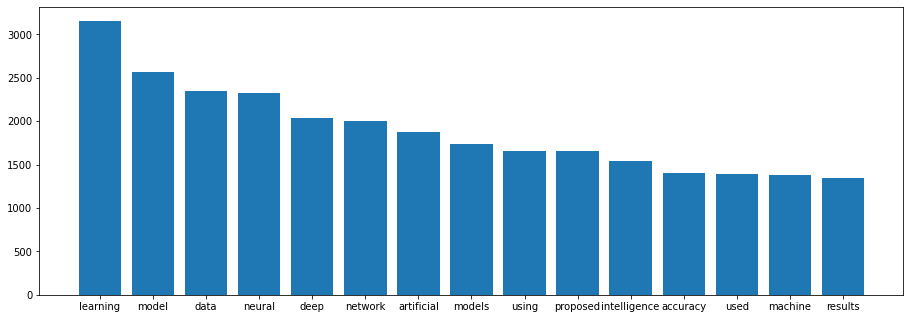

In [16]:
plot_bar(data=df, top=15)

In [ ]:
# Se llama a la funcion definida anteriormente

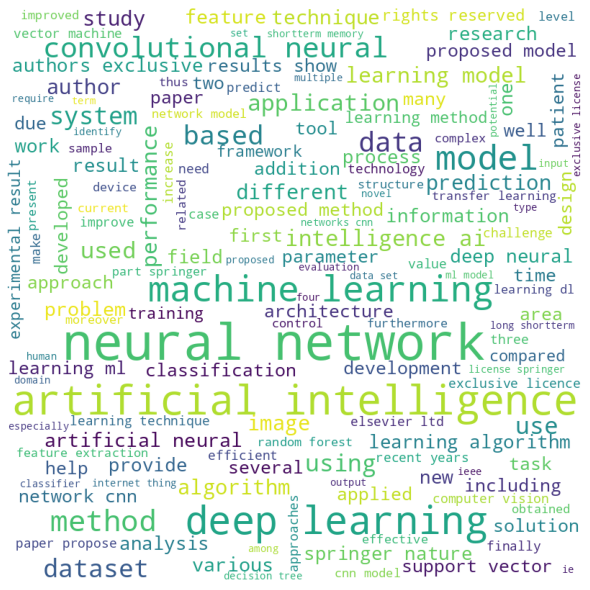

In [17]:
word_cloud = WordCloud(height=800, width=800, background_color='white',max_words=150, min_font_size=5, collocation_threshold=10).generate(clean_texto)
word_cloud.to_file("n1.png") 
plt.figure(figsize=(10,8))
plt.imshow(word_cloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
# Se crea una lluvia de ideas con un tamaño especifico usando el objeto clean_texto

In [18]:
data.head()

,Authors,Author(s) ID,Title,Year,Source title,Volume,Issue,Art. No.,Page start,Page end,...,ISBN,CODEN,PubMed ID,Language of Original Document,Abbreviated Source Title,Document Type,Publication Stage,Open Access,Source,EID
0,"Kale A., Nguyen T., Harris F.C., Jr., Li C., Z...",57848934500;54903214500;58044893900;5787202180...,Provenance documentation to enable explainable...,2023,Data Intelligence,5,1,NaN,139.0,162.0,...,NaN,NaN,NaN,English,Data. Intell.,Review,Final,"All Open Access, Gold",Scopus,2-s2.0-85150044366
1,"Caviglione L., Comito C., Guarascio M., Manco G.",8301144200;6602651162;55900121400;55002241700;,Emerging challenges and perspectives in Deep L...,2023,Systems and Soft Computing,5,NaN,200050,NaN,NaN,...,NaN,NaN,NaN,English,Syst. Soft. Comput.,Article,Final,"All Open Access, Gold",Scopus,2-s2.0-85150032932
2,"Kayadibi İ., Güraksın G.E.",57813237100;35100272200;,An Explainable Fully Dense Fusion Neural Netwo...,2023,International Journal of Computational Intelli...,16,1,28,NaN,NaN,...,NaN,NaN,NaN,English,Int. J. Comput. Intell. Syst.,Article,Final,"All Open Access, Gold",Scopus,2-s2.0-85149819697
3,"Aderemi B.A., Olwal T.O., Ndambuki J.M., Rwang...",57197737443;25031623600;6507377018;56096264000;,Groundwater levels forecasting using machine l...,2023,Systems and Soft Computing,5,NaN,200049,NaN,NaN,...,NaN,NaN,NaN,English,Syst. Soft. Comput.,Article,Final,"All Open Access, Gold",Scopus,2-s2.0-85149306325
4,"Sun W., Kalmady S.V., Sepehrvand N., Salimi A....",57211714779;26657946700;24068129900;5721534490...,Towards artificial intelligence-based learning...,2023,npj Digital Medicine,6,1,21,NaN,NaN,...,NaN,NaN,NaN,English,npj Digit. Med.,Article,Final,"All Open Access, Gold, Green",Scopus,2-s2.0-85147541005
